In [70]:
import numpy as np
import pandas as pd
import re

In [71]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [72]:
df = pd.read_csv('C:/Users/SONY/Machine_Learning_Project/Processed_Data/gurgaon_properties_cleaned_v1.csv')

In [73]:
df.duplicated().sum()

101

In [74]:
df['areaWithType']

0              Super Built up area 1900(176.52 sq.m.)Built Up area: 1600 sq.ft. (148.64 sq.m.)Carpet area: 1240 sq.ft. (115.2 sq.m.)
1                                                                                             Super Built up area 1376(127.83 sq.m.)
2             Super Built up area 2812(261.24 sq.m.)Built Up area: 2600 sq.ft. (241.55 sq.m.)Carpet area: 2400 sq.ft. (222.97 sq.m.)
3                                                                                                         Plot area 692(578.6 sq.m.)
4                                                                                             Super Built up area 1750(162.58 sq.m.)
5                                                                                                        Plot area 200(167.23 sq.m.)
6                                                        Super Built up area 1349(125.33 sq.m.)Carpet area: 963 sq.ft. (89.47 sq.m.)
7                                                                    

In [75]:
# focus is on -> areaWithType, additionalRoom, agePossession, furnishDetails, features 

# 1. areaWithType

In [76]:
df.sample(5)[['price','area','areaWithType']]

,price,area,areaWithType
1742,0.70,1517.0,Super Built up area 1352(125.6 sq.m.)
708,1.00,1554.0,Super Built up area 1554(144.37 sq.m.)
1041,1.43,1990.0,Super Built up area 1990(184.88 sq.m.)Carpet area: 1700 sq.ft. (157.94 sq.m.)
3214,0.48,96.0,Plot area 80(7.43 sq.m.)Built Up area: 795 sq.ft. (73.86 sq.m.)Carpet area: 720 sq.ft. (66.89 sq.m.)
3469,1.40,1750.0,Super Built up area 1750(162.58 sq.m.)


The difference between **Super Built-Up Area**, **Built-Up Area**, and **Carpet Area** in sorted order (from smallest to largest) is:

1. **Carpet Area** (smallest):
   - **Includes**: The actual usable area within the walls of the house or apartment,
                     where a carpet can be laid, Only the area that can be used or occupied inside the home.   
   - **Excludes**: thickness of the inner walls,Common areas, walls, balconies, terraces, etc.

2. **Built-Up Area**:
    - **Includes**: The total area within the outer walls of the house, Carpet area + area occupied by walls + balconies and terraces
   - **Excludes**: Common areas like lobbies, lifts, and staircases.

3. **Super Built-Up Area** (largest):
      - **Includes**: includes the Built-up area + proportion of common areas (lobbies, elevators, stairs, etc.)
                      like corridors,staircases, lobbies, and other shared spaces in the building.
      - **Excludes**: Areas outside the building, such as gardens or open spaces.

- **Carpet Area** < **Built-Up Area** < **Super Built-Up Area**.

In [77]:
def get_super_built_up_area(text):
    if isinstance(text, str):
        match = re.search(r'Super Built up area (\d+\.?\d*)', text)
        if match:
            return float(match.group(1))
    return None

    (\d+\.?\d*):
        It matches:
        \d+: One or more digits (0-9). This captures the numeric part of the area.
        \.?: An optional dot (.) to allow for decimal values.
        \d*: Zero or more digits after the optional dot (captures any decimal digits).

    float(match.group(1)) converts the string to a floating-point number.
    match.group(1) retrieves the first and only capture group, which matches the numeric part of the "Super Built up area" value.
    no match ==> None
    
    text = 'Super Built up area 1942(180.42 sq.m.)'

    group(1)
        Captured Group: 1942
        match.group(1): Returns '1942'
        float(match.group(1)): Converts 1942 to 1942 (a float)

In [78]:
def get_area(text, area_type):
    if isinstance(text, str):
        pattern = re.compile(rf'{re.escape(area_type)}\s*:\s*(\d+\.?\d*)')
        match = pattern.search(text)
        if match:
            return float(match.group(1))
    return None

    area_type + r'\s*:\s*(\d+\.?\d*)':
        area_type is the user-defined type of area (e.g., "Built Up area" or "Carpet area").
        \s*:\s* matches zero or more spaces around a colon (:), which is common in the format of area details.
        (\d+\.?\d*) captures the numerical part (number) of the area:
        \d+ matches one or more digits.
        \.? optionally matches a decimal point.
        \d* matches zero or more digits (for decimal values).

    Text: 'Built Up area: 1480 (137.5 sq.m.)Carpet area: 1050 sq.ft. (97.55 sq.m.)'

    137.5 is captured by the group (\d+\.?\d*)

    area_type = "Built Up area"

In [79]:
# This function checks if the area is provided in sq.m. and converts it to sqft if needed
def convert_to_sqft(text, area_value):
    if area_value is None:
        return None
    match = re.search(r'{} \((\d+\.?\d*) sq.m.\)'.format(area_value), text)
    if match:
        sq_m_value = float(match.group(1))
        return sq_m_value * 10.7639  # conversion factor from sq.m. to sqft
    return area_value

    text: A string that potentially contains the area information in square meters (sq.m.).

    area_value: The original area value that may need to be converted from square meters to square feet (sqft).

    r'{} \((\d+\.?\d*) sq.m.\)':

        {} is replaced by area_value using .format(area_value).

        \((\d+\.?\d*) sq.m.\) looks for a number inside parentheses followed by the string "sq.m.":
            \( and \) match the literal parentheses.
            (\d+\.?\d*) captures a number with optional decimals, representing the square meter value.
             
        sq.m. is a literal string for square meters.
    1480 (137.5 sq.m.) in the text where 1480 is the area_value.

    sq_m_value * 10.7639  # conversion factor from sq.m. to sqft

In [80]:
# Extract Super Built Up area
df['super_built_up_area'] = df['areaWithType'].apply(get_super_built_up_area)

# # Convert to sqft if needed
# df['super_built_up_area'] = df.apply(
#     lambda x: convert_to_sqft(x['areaWithType'], x['super_built_up_area']) 
#     if pd.notnull(x['super_built_up_area']) else None, 
#     axis=1
# )

    x (a row of the DataFrame)
    x['areaWithType']: The text data containing the area type and value.
    x['super_built_up_area']: The previously extracted super built-up area value from the first step.

In [81]:
# Extract Built Up area
df['built_up_area'] = df['areaWithType'].apply(lambda x: get_area(x, 'Built Up area'))

# Convert to sqft if needed
df['built_up_area'] = df.apply(
    lambda x: convert_to_sqft(x['areaWithType'], x['built_up_area']) 
    if pd.notnull(x['built_up_area']) else None, 
    axis=1
)

    get_area(x, 'Built Up area'), where:
        x is the text data for that row.
        'Built Up area' is passed as the area_type to the get_area function.

In [82]:
# Extract Carpet area and convert to sqft if needed
df['carpet_area'] = df['areaWithType'].apply(lambda x: get_area(x, 'Carpet area'))
df['carpet_area'] = df.apply(lambda x: convert_to_sqft(x['areaWithType'], x['carpet_area']), axis=1)

    convert_to_sqft(x['areaWithType'], x['built_up_area']):
        x['areaWithType']: The text in the row that might contain information about the area in square meters.
        x['built_up_area']: The value of the "Built Up area" that was extracted earlier.

In [83]:
df[['price','property_type','area','areaWithType','super_built_up_area','built_up_area','carpet_area']].sample(5)

,price,property_type,area,areaWithType,super_built_up_area,built_up_area,carpet_area
779,7.99,house,6382.0,Built Up area: 6382 (592.91 sq.m.),NaN,6382.0,NaN
2281,0.95,flat,1895.0,Built Up area: 1895 (176.05 sq.m.)Carpet area: 1500 sq.ft. (139.35 sq.m.),NaN,1895.0,1500.00
2660,1.30,flat,1650.0,Super Built up area 1650(153.29 sq.m.)Carpet area: 1022.58 sq.ft. (95 sq.m.),1650.0,NaN,1022.58
1031,0.80,flat,1245.0,Carpet area: 1245 (115.66 sq.m.),NaN,NaN,1245.00
2849,0.85,flat,597.0,Built Up area: 597 (55.46 sq.m.),NaN,597.0,NaN


In [84]:
df.duplicated().sum()

101

In [85]:
# Filter rows where none of the relevant area columns are null
df[~(df['super_built_up_area'].isnull() |df['built_up_area'].isnull() |df['carpet_area'].isnull())][['price', 'property_type', 'area', 'areaWithType', 'super_built_up_area', 'built_up_area', 'carpet_area']].shape

(491, 7)

    df['super_built_up_area'].isnull(): This checks if the super_built_up_area column contains null values, returning True for rows where it is null.
    ~: It inverts the condition, so rows where none of these columns are null will be selected.

In [86]:
# Filter rows where 'areaWithType' contains 'Plot' and select relevant columns
df[df['areaWithType'].str.contains('Plot', na=False)][['price', 'property_type', 'area', 'areaWithType', 'super_built_up_area', 'built_up_area', 'carpet_area']].head(5)

,price,property_type,area,areaWithType,super_built_up_area,built_up_area,carpet_area
3,6.25,house,6228.0,Plot area 692(578.6 sq.m.),NaN,NaN,NaN
5,2.00,house,1800.0,Plot area 200(167.23 sq.m.),NaN,NaN,NaN
7,0.50,house,600.0,Plot area 600(55.74 sq.m.),NaN,NaN,NaN
10,26.00,house,3150.0,Plot area 402(336.12 sq.m.)Built Up area: 400 sq.yards (334.45 sq.m.)Carpet area: 350 sq.yards (292.64 sq.m.),NaN,400.0,350.0
21,1.45,house,26032.0,Plot area 26000(2415.48 sq.m.),NaN,NaN,NaN


    .str.contains('Plot'):
        This checks whether the string 'Plot' is present in each element of the 'areaWithType' column.
        It returns True for rows where 'Plot' is found and False otherwise

In [87]:
df.isnull().sum()

society                   1
property_type             0
price                    18
price_per_sqft           18
areaWithType              0
area                     18
bedRoom                   0
bathroom                  0
balcony                   0
additionalRoom            0
floorNum                 21
facing                  963
agePossession             1
nearbyLocations         184
furnishDetails          915
features                613
property_id             919
sector                    0
super_built_up_area    1744
built_up_area          2357
carpet_area            1778
dtype: int64

In [88]:
all_nan_df = df[((df['super_built_up_area'].isnull()) & (df['built_up_area'].isnull()) &(df['carpet_area'].isnull()))][['price','property_type','area','areaWithType','super_built_up_area','built_up_area','carpet_area']]

    df['super_built_up_area'].isnull():
        Checks if the 'super_built_up_area' column contains NaN values (returns True for rows with NaN).

In [89]:
all_nan_df.head()

,price,property_type,area,areaWithType,super_built_up_area,built_up_area,carpet_area
3,6.25,house,6228.0,Plot area 692(578.6 sq.m.),NaN,NaN,NaN
5,2.00,house,1800.0,Plot area 200(167.23 sq.m.),NaN,NaN,NaN
7,0.50,house,600.0,Plot area 600(55.74 sq.m.),NaN,NaN,NaN
21,1.45,house,26032.0,Plot area 26000(2415.48 sq.m.),NaN,NaN,NaN
33,10.00,house,3240.0,Plot area 360(301.01 sq.m.),NaN,NaN,NaN


In [90]:
all_nan_index = df[((df['super_built_up_area'].isnull()) & (df['built_up_area'].isnull()) & (df['carpet_area'].isnull()))][['price','property_type','area','areaWithType','super_built_up_area','built_up_area','carpet_area']].index

    .index:
        retrieves the index labels of the filtered DataFrame. These indices correspond to the rows where all three columns have NaN values.

In [91]:
def extract_plot_area(area_with_type):
    # Ensure area_with_type is a string
    if isinstance(area_with_type, str):
        match = re.search(r'Plot area (\d+\.?\d*)', area_with_type)
        return float(match.group(1)) if match else None
    return None

    re.search(r'Plot area (\d+\.?\d*)', area_with_type):
        re.search(): This function searches the given string (area_with_type) for a pattern defined by the regular expression.
    r'Plot area (\d+\.?\d*)':
        This is a regular expression pattern used to match the plot area.
    Plot area: 
        The literal text that the pattern is looking for.
    (\d+\.?\d*):
        This captures the numerical value following the text "Plot area".
    \d+:
        Matches one or more digits.
    \.?:
        Optionally matches a decimal point.
    \d*: 
        Matches zero or more digits following the decimal point.
    ():
        Parentheses are used to create a capture group for the numerical value.

In [92]:
all_nan_df['built_up_area'] = all_nan_df['areaWithType'].apply(extract_plot_area)

In [93]:
# Update the original dataframe
#gurgaon_properties.update(filtered_rows)
all_nan_df

,price,property_type,area,areaWithType,super_built_up_area,built_up_area,carpet_area
3,6.25,house,6228.0,Plot area 692(578.6 sq.m.),NaN,692.00,NaN
5,2.00,house,1800.0,Plot area 200(167.23 sq.m.),NaN,200.00,NaN
7,0.50,house,600.0,Plot area 600(55.74 sq.m.),NaN,600.00,NaN
21,1.45,house,26032.0,Plot area 26000(2415.48 sq.m.),NaN,26000.00,NaN
33,10.00,house,3240.0,Plot area 360(301.01 sq.m.),NaN,360.00,NaN
41,0.07,house,277.0,Plot area 33(27.59 sq.m.),NaN,33.00,NaN
44,18.00,house,4500.0,Plot area 500(418.06 sq.m.),NaN,500.00,NaN
47,14.00,house,2250.0,Plot area 250(209.03 sq.m.),NaN,250.00,NaN
53,5.00,house,2250.0,Plot area 250(209.03 sq.m.),NaN,250.00,NaN
54,2.25,house,900.0,Plot area 100(83.61 sq.m.),NaN,100.00,NaN


In [94]:
def convert_scale(row):
    if np.isnan(row['area']) or np.isnan(row['built_up_area']):
        return row['built_up_area']
    else:
        if round(row['area']/row['built_up_area']) == 9.0:
            return row['built_up_area'] * 9
        elif round(row['area']/row['built_up_area']) == 11.0:
            return row['built_up_area'] * 10.7
        else:
            return row['built_up_area']

    if np.isnan(row['area']) or np.isnan(row['built_up_area'])::
    np.isnan(): Checks if the value is NaN (Not a Number).
    If either area or built_up_area is NaN, the function simply returns the value of built_up_area.

    else:: If both area and built_up_area are not NaN, the function proceeds to adjust the built_up_area based on the ratio of area to built_up_area.

    if round(row['area'] / row['built_up_area']) == 9.0:
    elif round(row['area'] / row['built_up_area']) == 11.0:


    If the ratio is 9.0, it scales built_up_area by a factor of 9.
    If the ratio is 11.0, it scales built_up_area by a factor of 10.7.
    Otherwise, it returns the original built_up_area.

In [95]:
all_nan_df['built_up_area'] = all_nan_df.apply(convert_scale,axis=1)

In [96]:
all_nan_df

,price,property_type,area,areaWithType,super_built_up_area,built_up_area,carpet_area
3,6.25,house,6228.0,Plot area 692(578.6 sq.m.),NaN,6228.00,NaN
5,2.00,house,1800.0,Plot area 200(167.23 sq.m.),NaN,1800.00,NaN
7,0.50,house,600.0,Plot area 600(55.74 sq.m.),NaN,600.00,NaN
21,1.45,house,26032.0,Plot area 26000(2415.48 sq.m.),NaN,26000.00,NaN
33,10.00,house,3240.0,Plot area 360(301.01 sq.m.),NaN,3240.00,NaN
41,0.07,house,277.0,Plot area 33(27.59 sq.m.),NaN,33.00,NaN
44,18.00,house,4500.0,Plot area 500(418.06 sq.m.),NaN,4500.00,NaN
47,14.00,house,2250.0,Plot area 250(209.03 sq.m.),NaN,2250.00,NaN
53,5.00,house,2250.0,Plot area 250(209.03 sq.m.),NaN,2250.00,NaN
54,2.25,house,900.0,Plot area 100(83.61 sq.m.),NaN,900.00,NaN


In [97]:
all_nan_df[['super_built_up_area','built_up_area','carpet_area']]

,super_built_up_area,built_up_area,carpet_area
3,NaN,6228.00,NaN
5,NaN,1800.00,NaN
7,NaN,600.00,NaN
21,NaN,26000.00,NaN
33,NaN,3240.00,NaN
41,NaN,33.00,NaN
44,NaN,4500.00,NaN
47,NaN,2250.00,NaN
53,NaN,2250.00,NaN
54,NaN,900.00,NaN


In [98]:
# update the original dataframe
df.update(all_nan_df)

In [99]:
df

,society,property_type,price,price_per_sqft,areaWithType,area,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,property_id,sector,super_built_up_area,built_up_area,carpet_area
0,emaar palm gardens,flat,1.75,9210.0,Super Built up area 1900(176.52 sq.m.)Built Up area: 1600 sq.ft. (148.64 sq.m.)Carpet area: 1240 sq.ft. (115.2 sq.m.),1900.0,3,3,3,servant room,6.0,West,1 to 5 Year Old,"[""V'Lante Mall"", 'NH 48 Gurugram', 'iGrow Montessori Play School', 'Matrikiran High School', 'Badsa AMS Hospital', 'GlobalHealthcare Multispeciality', 'Indira Gandhi International Airport', 'Patli Railway Station', 'Hyatt Regency', 'Nakhrola Stadium', 'Cricket Academy']","['3 Wardrobe', '8 Fan', '1 Exhaust Fan', '1 Stove', '10 Light', '1 Chimney', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Curtains', 'No Dining Table', 'No Geyser', 'No Microwave', 'No Fridge', 'No Sofa', 'No TV', 'No Washing Machine', 'No Water Purifier']","['Water purifier', 'Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Private Garden / Terrace', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Bank Attached Property', 'Internet/wi-fi connectivity', 'Recently Renovated', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Low Density Society', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']",V69525180,sector 83,1900.00,1600.000000,1240.000000
1,eros wembley estate,flat,1.40,10174.0,Super Built up area 1376(127.83 sq.m.),1376.0,3,3,2,store room,9.0,East,1 to 5 Year Old,"['Sri Radhe Krishna Temple', 'Standard chartered ATM', 'Icici bank ATM', 'Bones Clinic - Orthopaedics', 'Skin Clinic', 'Divine Look Clinic Centre', 'Vatsalya Clinic', 'Dr. Naresh Pandita', 'Dr. Anuj Sharma', 'Meher Clinic', 'Vishesh Dental', 'Neelkanth Health Care', 'Dr. Aruna Kalra', 'Wellness Eye Centre', 'Park Hospital Gurgaon', 'Best Urologist Atcomplete Family Clinic', 'Ekta Hospital', 'Sai Heart and Trauma Center', 'Sanjeevani Hospital Gurgaon', 'Sona Devi Memorial Hospital and Trauma Centre', 'Sai Dharamraj Hospital', 'Wembley estate club', 'Genius', 'Gardian Pharmacy', 'Apollo Pharmacy', 'SPAZE BUSINESS PARK', 'Kore Tech Park', 'Unitech', 'Hdfc bank', 'Hdfc bank', 'Icici bank', 'Indusind bank', 'Hdfc bank', 'Hdfc bank', 'SRS Cinemas', 'India', 'Madison and Pike', 'Haldiram', ""Domino's Pizza"", ""Nirula's"", 'Starbucks', 'Nook', 'Kamla International', 'Gurugram University', 'Delhi Public School Primary Section']","['2 Wardrobe', '1 Water Purifier', '5 Fan', '1 Exhaust Fan', '2 Geyser', '6 Light', '1 Curtains', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Chimney', 'No Dining Table', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Washing Machine']","['Security / Fire Alarm', 'Power Back-up', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Piped-gas', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Internet/wi-fi connectivity', 'Shopping Centre', 'Fitness Centre / GYM', 'Waste Disposal', 'Rain Water Harvesting', 'Club house / Community Center', 'Water softening plant']",K69325724,sector 50,1376.00,NaN,NaN
2,ss the leaf,flat,2.13,7574.0,Super Built up area 2812(261.24 sq.m.)Built Up area: 2600 sq.ft. (241.55 sq.m.)Carpet area: 2400 sq.ft. (222.97 sq.m.),2812.0,4,4,3,not available,6.0,North,1 to 5 Year Old,"['Sapphire 83 Mall', 'Dwarka Expressway', 'Central Peripheral Road', 'NH 08', 'Pataudi Road', 'Delhi Public School Sector 84', 'DPG Institute of Technology', 'Genesis Hospital Sector 84', 'Indira Gandhi International Airport', 'Imt Manesar', 'Holiday Inn Hotel Sector 90', 'SkyJumper Trampoline 

In [100]:
df.isnull().sum()

society                   1
property_type             0
price                    18
price_per_sqft           18
areaWithType              0
area                     18
bedRoom                   0
bathroom                  0
balcony                   0
additionalRoom            0
floorNum                 21
facing                  963
agePossession             1
nearbyLocations         184
furnishDetails          915
features                613
property_id             919
sector                    0
super_built_up_area    1744
built_up_area          1775
carpet_area            1778
dtype: int64

In [101]:
df.head()

,society,property_type,price,price_per_sqft,areaWithType,area,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,property_id,sector,super_built_up_area,built_up_area,carpet_area
0,emaar palm gardens,flat,1.75,9210.0,Super Built up area 1900(176.52 sq.m.)Built Up area: 1600 sq.ft. (148.64 sq.m.)Carpet area: 1240 sq.ft. (115.2 sq.m.),1900.0,3,3,3,servant room,6.0,West,1 to 5 Year Old,"[""V'Lante Mall"", 'NH 48 Gurugram', 'iGrow Montessori Play School', 'Matrikiran High School', 'Badsa AMS Hospital', 'GlobalHealthcare Multispeciality', 'Indira Gandhi International Airport', 'Patli Railway Station', 'Hyatt Regency', 'Nakhrola Stadium', 'Cricket Academy']","['3 Wardrobe', '8 Fan', '1 Exhaust Fan', '1 Stove', '10 Light', '1 Chimney', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Curtains', 'No Dining Table', 'No Geyser', 'No Microwave', 'No Fridge', 'No Sofa', 'No TV', 'No Washing Machine', 'No Water Purifier']","['Water purifier', 'Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Private Garden / Terrace', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Bank Attached Property', 'Internet/wi-fi connectivity', 'Recently Renovated', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Low Density Society', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']",V69525180,sector 83,1900.0,1600.0,1240.0
1,eros wembley estate,flat,1.40,10174.0,Super Built up area 1376(127.83 sq.m.),1376.0,3,3,2,store room,9.0,East,1 to 5 Year Old,"['Sri Radhe Krishna Temple', 'Standard chartered ATM', 'Icici bank ATM', 'Bones Clinic - Orthopaedics', 'Skin Clinic', 'Divine Look Clinic Centre', 'Vatsalya Clinic', 'Dr. Naresh Pandita', 'Dr. Anuj Sharma', 'Meher Clinic', 'Vishesh Dental', 'Neelkanth Health Care', 'Dr. Aruna Kalra', 'Wellness Eye Centre', 'Park Hospital Gurgaon', 'Best Urologist Atcomplete Family Clinic', 'Ekta Hospital', 'Sai Heart and Trauma Center', 'Sanjeevani Hospital Gurgaon', 'Sona Devi Memorial Hospital and Trauma Centre', 'Sai Dharamraj Hospital', 'Wembley estate club', 'Genius', 'Gardian Pharmacy', 'Apollo Pharmacy', 'SPAZE BUSINESS PARK', 'Kore Tech Park', 'Unitech', 'Hdfc bank', 'Hdfc bank', 'Icici bank', 'Indusind bank', 'Hdfc bank', 'Hdfc bank', 'SRS Cinemas', 'India', 'Madison and Pike', 'Haldiram', ""Domino's Pizza"", ""Nirula's"", 'Starbucks', 'Nook', 'Kamla International', 'Gurugram University', 'Delhi Public School Primary Section']","['2 Wardrobe', '1 Water Purifier', '5 Fan', '1 Exhaust Fan', '2 Geyser', '6 Light', '1 Curtains', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Chimney', 'No Dining Table', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Washing Machine']","['Security / Fire Alarm', 'Power Back-up', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Piped-gas', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Internet/wi-fi connectivity', 'Shopping Centre', 'Fitness Centre / GYM', 'Waste Disposal', 'Rain Water Harvesting', 'Club house / Community Center', 'Water softening plant']",K69325724,sector 50,1376.0,NaN,NaN
2,ss the leaf,flat,2.13,7574.0,Super Built up area 2812(261.24 sq.m.)Built Up area: 2600 sq.ft. (241.55 sq.m.)Carpet area: 2400 sq.ft. (222.97 sq.m.),2812.0,4,4,3,not available,6.0,North,1 to 5 Year Old,"['Sapphire 83 Mall', 'Dwarka Expressway', 'Central Peripheral Road', 'NH 08', 'Pataudi Road', 'Delhi Public School Sector 84', 'DPG Institute of Technology', 'Genesis Hospital Sector 84', 'Indira Gandhi International Airport', 'Imt Manesar', 'Holiday Inn Hotel Sector 90', 'SkyJumper Trampoline Park', 'Nakh

# 2.additionalRoom

In [102]:
df['additionalRoom'].value_counts()

additionalRoom
not available                                    1377
servant room                                      657
others                                            221
study room                                        221
pooja room                                        150
store room                                        100
study room,servant room                            96
pooja room,servant room                            82
pooja room,study room,servant room,store room      71
servant room,others                                58
pooja room,study room,servant room                 53
pooja room,study room,servant room,others          51
servant room,pooja room                            37
servant room,store room                            30
study room,others                                  27
pooja room,study room                              24
pooja room,others                                  17
pooja room,store room                              15
pooja room,st

In [103]:
# additional room
# List of new columns to be created
new_cols = ['study room', 'servant room', 'store room', 'pooja room', 'others']

In [104]:
# Populate the new columns based on the "additionalRoom" column
for col in new_cols:
    df[col] = df['additionalRoom'].str.contains(col, na=False).astype(int)

In [105]:
df.sample(5)[['additionalRoom','study room', 'servant room', 'store room', 'pooja room', 'others']]

,additionalRoom,study room,servant room,store room,pooja room,others
2040,"pooja room,study room",1,0,0,1,0
162,"pooja room,study room,store room",1,0,1,1,0
3043,"pooja room,study room,servant room",1,1,0,1,0
3006,study room,1,0,0,0,0
2009,"study room,servant room,store room,pooja room",1,1,1,1,0


In [106]:
df.head()

,society,property_type,price,price_per_sqft,areaWithType,area,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,property_id,sector,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others
0,emaar palm gardens,flat,1.75,9210.0,Super Built up area 1900(176.52 sq.m.)Built Up area: 1600 sq.ft. (148.64 sq.m.)Carpet area: 1240 sq.ft. (115.2 sq.m.),1900.0,3,3,3,servant room,6.0,West,1 to 5 Year Old,"[""V'Lante Mall"", 'NH 48 Gurugram', 'iGrow Montessori Play School', 'Matrikiran High School', 'Badsa AMS Hospital', 'GlobalHealthcare Multispeciality', 'Indira Gandhi International Airport', 'Patli Railway Station', 'Hyatt Regency', 'Nakhrola Stadium', 'Cricket Academy']","['3 Wardrobe', '8 Fan', '1 Exhaust Fan', '1 Stove', '10 Light', '1 Chimney', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Curtains', 'No Dining Table', 'No Geyser', 'No Microwave', 'No Fridge', 'No Sofa', 'No TV', 'No Washing Machine', 'No Water Purifier']","['Water purifier', 'Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Private Garden / Terrace', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Bank Attached Property', 'Internet/wi-fi connectivity', 'Recently Renovated', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Low Density Society', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']",V69525180,sector 83,1900.0,1600.0,1240.0,0,1,0,0,0
1,eros wembley estate,flat,1.40,10174.0,Super Built up area 1376(127.83 sq.m.),1376.0,3,3,2,store room,9.0,East,1 to 5 Year Old,"['Sri Radhe Krishna Temple', 'Standard chartered ATM', 'Icici bank ATM', 'Bones Clinic - Orthopaedics', 'Skin Clinic', 'Divine Look Clinic Centre', 'Vatsalya Clinic', 'Dr. Naresh Pandita', 'Dr. Anuj Sharma', 'Meher Clinic', 'Vishesh Dental', 'Neelkanth Health Care', 'Dr. Aruna Kalra', 'Wellness Eye Centre', 'Park Hospital Gurgaon', 'Best Urologist Atcomplete Family Clinic', 'Ekta Hospital', 'Sai Heart and Trauma Center', 'Sanjeevani Hospital Gurgaon', 'Sona Devi Memorial Hospital and Trauma Centre', 'Sai Dharamraj Hospital', 'Wembley estate club', 'Genius', 'Gardian Pharmacy', 'Apollo Pharmacy', 'SPAZE BUSINESS PARK', 'Kore Tech Park', 'Unitech', 'Hdfc bank', 'Hdfc bank', 'Icici bank', 'Indusind bank', 'Hdfc bank', 'Hdfc bank', 'SRS Cinemas', 'India', 'Madison and Pike', 'Haldiram', ""Domino's Pizza"", ""Nirula's"", 'Starbucks', 'Nook', 'Kamla International', 'Gurugram University', 'Delhi Public School Primary Section']","['2 Wardrobe', '1 Water Purifier', '5 Fan', '1 Exhaust Fan', '2 Geyser', '6 Light', '1 Curtains', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Chimney', 'No Dining Table', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Washing Machine']","['Security / Fire Alarm', 'Power Back-up', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Piped-gas', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Internet/wi-fi connectivity', 'Shopping Centre', 'Fitness Centre / GYM', 'Waste Disposal', 'Rain Water Harvesting', 'Club house / Community Center', 'Water softening plant']",K69325724,sector 50,1376.0,NaN,NaN,0,0,1,0,0
2,ss the leaf,flat,2.13,7574.0,Super Built up area 2812(261.24 sq.m.)Built Up area: 2600 sq.ft. (241.55 sq.m.)Carpet area: 2400 sq.ft. (222.97 sq.m.),2812.0,4,4,3,not available,6.0,North,1 to 5 Year Old,"['Sapphire 83 Mall', 'Dwarka Expressway', 'Central Peripheral Road', 'NH 08', 'Pataudi Road', 'Delhi Public School Sector 84', 'DPG Institute of Technology', 'Genesis Hospital Sector 84', 'Indira Gandhi International Airport', 'Imt Ma

# 3.agePossession

In [107]:
df['agePossession'].value_counts()

agePossession
1 to 5 Year Old       1567
5 to 10 Year Old       516
0 to 1 Year Old        460
undefined              327
10+ Year Old           292
Under Construction      71
Within 6 months         58
Within 3 months         24
Dec 2023                20
By 2024                 16
By 2023                 15
Dec 2024                13
Mar 2024                13
Oct 2024                 8
Jan 2024                 6
Jun 2024                 6
Dec 2025                 5
Nov 2023                 5
By 2025                  4
Aug 2023                 4
Aug 2024                 4
Oct 2023                 4
May 2024                 3
Jul 2024                 3
Sep 2023                 3
Jan 2025                 3
Feb 2024                 3
Nov 2024                 3
Mar 2025                 2
Dec 2026                 2
Jul 2027                 2
Aug 2025                 2
By 2027                  2
Oct 2025                 2
Apr 2024                 1
Jul 2026                 1
Sep 2027      

In [108]:
def categorize_age_possession(value):
    if pd.isna(value):
        return "Undefined"
    if "0 to 1 Year Old" in value or "Within 6 months" in value or "Within 3 months" in value:
        return "New Property"
    if "1 to 5 Year Old" in value:
        return "Relatively New"
    if "5 to 10 Year Old" in value:
        return "Moderately Old"
    if "10+ Year Old" in value:
        return "Old Property"
    if "Under Construction" in value or "By" in value:
        return "Under Construction"
    try:
        # For entries like 'May 2024'
        int(value.split(" ")[-1])
        return "Under Construction"
    except:
        return "Undefined"

In [109]:
df['agePossession'] = df['agePossession'].apply(categorize_age_possession)

In [110]:
df['agePossession'].value_counts()

agePossession
Relatively New        1567
New Property           542
Moderately Old         516
Undefined              328
Old Property           292
Under Construction     235
Name: count, dtype: int64

In [111]:
df.head()

,society,property_type,price,price_per_sqft,areaWithType,area,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,property_id,sector,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others
0,emaar palm gardens,flat,1.75,9210.0,Super Built up area 1900(176.52 sq.m.)Built Up area: 1600 sq.ft. (148.64 sq.m.)Carpet area: 1240 sq.ft. (115.2 sq.m.),1900.0,3,3,3,servant room,6.0,West,Relatively New,"[""V'Lante Mall"", 'NH 48 Gurugram', 'iGrow Montessori Play School', 'Matrikiran High School', 'Badsa AMS Hospital', 'GlobalHealthcare Multispeciality', 'Indira Gandhi International Airport', 'Patli Railway Station', 'Hyatt Regency', 'Nakhrola Stadium', 'Cricket Academy']","['3 Wardrobe', '8 Fan', '1 Exhaust Fan', '1 Stove', '10 Light', '1 Chimney', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Curtains', 'No Dining Table', 'No Geyser', 'No Microwave', 'No Fridge', 'No Sofa', 'No TV', 'No Washing Machine', 'No Water Purifier']","['Water purifier', 'Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Private Garden / Terrace', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Bank Attached Property', 'Internet/wi-fi connectivity', 'Recently Renovated', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Low Density Society', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']",V69525180,sector 83,1900.0,1600.0,1240.0,0,1,0,0,0
1,eros wembley estate,flat,1.40,10174.0,Super Built up area 1376(127.83 sq.m.),1376.0,3,3,2,store room,9.0,East,Relatively New,"['Sri Radhe Krishna Temple', 'Standard chartered ATM', 'Icici bank ATM', 'Bones Clinic - Orthopaedics', 'Skin Clinic', 'Divine Look Clinic Centre', 'Vatsalya Clinic', 'Dr. Naresh Pandita', 'Dr. Anuj Sharma', 'Meher Clinic', 'Vishesh Dental', 'Neelkanth Health Care', 'Dr. Aruna Kalra', 'Wellness Eye Centre', 'Park Hospital Gurgaon', 'Best Urologist Atcomplete Family Clinic', 'Ekta Hospital', 'Sai Heart and Trauma Center', 'Sanjeevani Hospital Gurgaon', 'Sona Devi Memorial Hospital and Trauma Centre', 'Sai Dharamraj Hospital', 'Wembley estate club', 'Genius', 'Gardian Pharmacy', 'Apollo Pharmacy', 'SPAZE BUSINESS PARK', 'Kore Tech Park', 'Unitech', 'Hdfc bank', 'Hdfc bank', 'Icici bank', 'Indusind bank', 'Hdfc bank', 'Hdfc bank', 'SRS Cinemas', 'India', 'Madison and Pike', 'Haldiram', ""Domino's Pizza"", ""Nirula's"", 'Starbucks', 'Nook', 'Kamla International', 'Gurugram University', 'Delhi Public School Primary Section']","['2 Wardrobe', '1 Water Purifier', '5 Fan', '1 Exhaust Fan', '2 Geyser', '6 Light', '1 Curtains', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Chimney', 'No Dining Table', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Washing Machine']","['Security / Fire Alarm', 'Power Back-up', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Piped-gas', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Internet/wi-fi connectivity', 'Shopping Centre', 'Fitness Centre / GYM', 'Waste Disposal', 'Rain Water Harvesting', 'Club house / Community Center', 'Water softening plant']",K69325724,sector 50,1376.0,NaN,NaN,0,0,1,0,0
2,ss the leaf,flat,2.13,7574.0,Super Built up area 2812(261.24 sq.m.)Built Up area: 2600 sq.ft. (241.55 sq.m.)Carpet area: 2400 sq.ft. (222.97 sq.m.),2812.0,4,4,3,not available,6.0,North,Relatively New,"['Sapphire 83 Mall', 'Dwarka Expressway', 'Central Peripheral Road', 'NH 08', 'Pataudi Road', 'Delhi Public School Sector 84', 'DPG Institute of Technology', 'Genesis Hospital Sector 84', 'Indira Gandhi International Airport', 'Imt Manes

# 4.furnishDetails

In [112]:
df.sample(5)[['furnishDetails','features']]

,furnishDetails,features
3168,[],"['Lift(s)', 'Swimming Pool', 'Park', 'Club house / Community Center', 'Fitness Centre / GYM', 'Shopping Centre', 'Rain Water Harvesting']"
1255,"['1 Exhaust Fan', '1 Light', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Chimney', 'No Curtains', 'No Dining Table', 'No Fan', 'No Geyser', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Wardrobe', 'No Washing Machine', 'No Water Purifier']","['Water purifier', 'Centrally Air Conditioned', 'Security / Fire Alarm', 'Power Back-up', 'Feng Shui / Vaastu Compliant', 'Private Garden / Terrace', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Bank Attached Property', 'Piped-gas', 'Internet/wi-fi connectivity', 'Recently Renovated', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Spacious Interiors', 'Low Density Society', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']"
1066,"['15 Light', '5 AC', 'No Bed', 'No Chimney', 'No Curtains', 'No Dining Table', 'No Exhaust Fan', 'No Fan', 'No Geyser', 'No Modular Kitchen', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Wardrobe', 'No Washing Machine', 'No Water Purifier']","['Centrally Air Conditioned', 'Water purifier', 'Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Bank Attached Property', 'Piped-gas', 'Internet/wi-fi connectivity', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Low Density Society', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']"
1652,"['3 Fan', '1 Exhaust Fan', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Chimney', 'No Curtains', 'No Dining Table', 'No Geyser', 'No Light', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Wardrobe', 'No Washing Machine', 'No Water Purifier']","['Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'Maintenance Staff', 'Water Storage', 'Separate entry for servant room', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Shopping Centre', 'Fitness Centre / GYM', 'Waste Disposal', 'Rain Water Harvesting', 'Club house / Community Center', 'Water softening plant']"
594,NaN,"['Security / Fire Alarm', 'Intercom Facility', 'Lift(s)', 'Maintenance Staff', 'Swimming Pool', 'Park', 'Visitor Parking', 'Fitness Centre / GYM', 'Club house / Community Center', 'Rain Water Harvesting']"


In [113]:
# Extract all unique furnishings from the furnishDetails column
all_furnishings = []
for detail in df['furnishDetails'].dropna():
    furnishings = detail.replace('[', '').replace(']', '').replace("'", "").split(', ')
    all_furnishings.extend(furnishings)
unique_furnishings = list(set(all_furnishings))

    df['furnishDetails'].dropna(): 
        Drops any NaN values from the furnishDetails column, so only non-null values are processed.

    Clean and Split the Furnishings String:
        furnishings = detail.replace('[', '').replace(']', '').replace("'", "").split(', '):
        detail.replace('[', '').replace(']', '').replace("'", ""): Removes the characters [, ], and ' from the string. These characters might be used for formatting (e.g., in a list or tuple format).
            .split(', '): Splits the cleaned string into a list of furnishings using ', ' as the delimiter.

    set(all_furnishings): Converts the list of all furnishings to a set to remove duplicates.

In [114]:
# Define a function to extract the count of a furnishing from the furnishDetails
def get_furnishing_count(details, furnishing):
    if isinstance(details, str):
        if f"No {furnishing}" in details:
            return 0
        pattern = re.compile(f"(\d+) {furnishing}")
        match = pattern.search(details)
        if match:
            return int(match.group(1))
        elif furnishing in details:
            return 1
    return 0

<>:6: SyntaxWarning: invalid escape sequence '\d'
<>:6: SyntaxWarning: invalid escape sequence '\d'
C:\Users\SONY\AppData\Local\Temp\ipykernel_7844\323174201.py:6: SyntaxWarning: invalid escape sequence '\d'
  pattern = re.compile(f"(\d+) {furnishing}")


    Handle the Case Where No Furnishing is Present:

    if f"No {furnishing}" in details:
        Checks if the string contains a phrase indicating that the furnishing is explicitly stated as not present.
        If found, it returns 0, meaning the furnishing count is zero.

    pattern = re.compile(f"(\d+) {furnishing}"):

    Creates a regular expression pattern to match a number followed by the furnishing name.
        (\d+):
            Captures one or more digits (the count).
        {furnishing}:
            Matches the furnishing name.

    It handles various scenarios:
        If the furnishing is explicitly stated as not present, it returns 0.
        If the count is explicitly mentioned in the string, it returns that count.
        If the furnishing is mentioned without a count, it returns 1.
        If the furnishing is not mentioned at all, it returns 0.

In [115]:
# Simplify the furnishings list by removing "No" prefix and numbers
columns_to_include = [re.sub(r'No |\d+', '', furnishing).strip() for furnishing in unique_furnishings]
columns_to_include = list(set(columns_to_include))  # Get unique furnishings
columns_to_include = [furnishing for furnishing in columns_to_include if furnishing]  # Remove empty strings

    Remove Prefixes and Numbers:
        [re.sub(r'No |\d+', '', furnishing).strip() for furnishing in unique_furnishings]:
        r'No |\d+':
            No :
                Matches the literal text "No " (including the space).
            \d+:
                Matches one or more digits.
        furnishing:
                The string from which prefixes and numbers are removed.
        .strip(): 
                Removes any leading or trailing whitespace from the resulting string.

    Get Unique Furnishings:

        set(columns_to_include):
            Converts the list to a set to remove duplicate values.
        list(...): Converts the set back to a list.
    
    Remove Empty Strings:

        [furnishing for furnishing in columns_to_include if furnishing]:
                A list comprehension to filter out any empty strings that may have resulted from the cleaning process.
        if furnishing:
                Only includes non-empty strings in the final list.

In [116]:
# Create new columns for each unique furnishing and populate with counts
for furnishing in columns_to_include:
    df[furnishing] = df['furnishDetails'].apply(lambda x: get_furnishing_count(x, furnishing))

In [117]:
# Create the new dataframe with the required columns
furnishings_df = df[['furnishDetails'] + columns_to_include]

In [118]:
furnishings_df.shape

(3480, 19)

In [119]:
furnishings_df.drop(columns=['furnishDetails'],inplace=True)

C:\Users\SONY\AppData\Local\Temp\ipykernel_7844\114705885.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  furnishings_df.drop(columns=['furnishDetails'],inplace=True)


In [120]:
furnishings_df.sample(5)

,Microwave,Wardrobe,Modular Kitchen,Exhaust Fan,Light,Curtains,Sofa,TV,Washing Machine,Stove,AC,Geyser,Fridge,Water Purifier,Fan,Dining Table,Bed,Chimney
1480,0,5,1,1,50,1,0,0,0,1,15,0,0,0,0,0,0,1
326,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
425,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
580,0,3,1,1,6,0,0,0,0,0,5,3,0,0,6,0,0,1
1746,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [121]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [122]:
scaler = StandardScaler()

In [123]:
scaled_data = scaler.fit_transform(furnishings_df)

In [124]:
wcss_reduced = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(scaled_data)
    wcss_reduced.append(kmeans.inertia_)

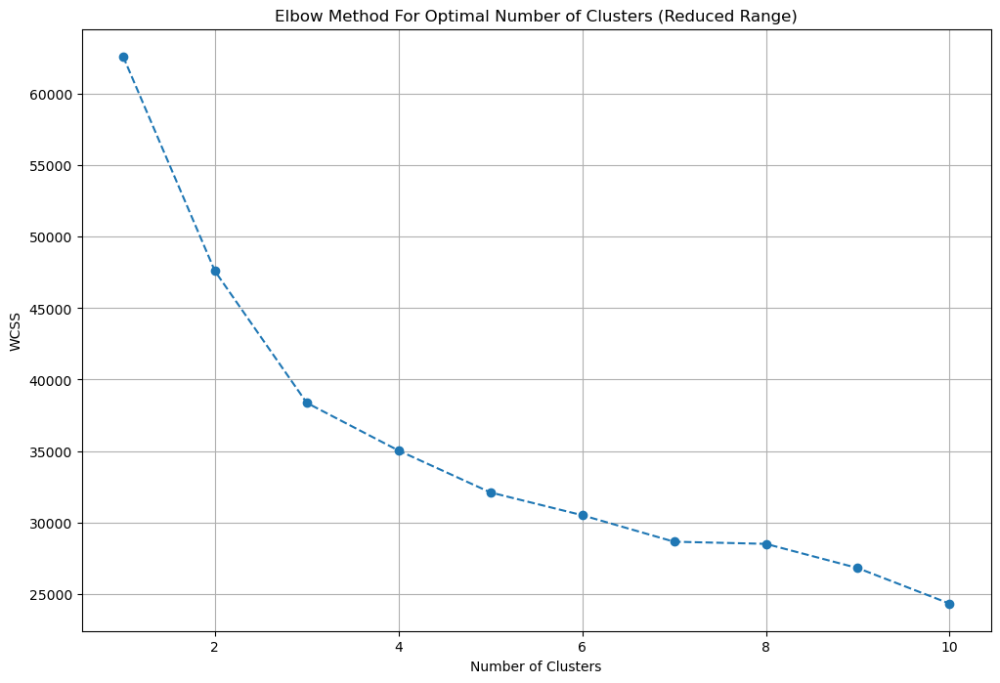

In [125]:
# Plot the results
plt.figure(figsize=(12, 8))
plt.plot(range(1,11), wcss_reduced, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal Number of Clusters (Reduced Range)')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

In [126]:
n_clusters = 3

In [127]:
# Fit the KMeans model
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(scaled_data)

KMeans(n_clusters=3, random_state=42)

In [128]:
# Predict the cluster assignments for each row
cluster_assignments = kmeans.predict(scaled_data)

In [129]:
df = df.iloc[:,:-18]

In [130]:
df['furnishing_type'] = cluster_assignments

In [131]:
df.sample(5)[['furnishDetails','furnishing_type']]

,furnishDetails,furnishing_type
915,"['4 Wardrobe', '9 Fan', '1 Exhaust Fan', '6 Geyser', '1 Stove', '16 Light', '7 AC', '1 Modular Kitchen', '1 Chimney', 'No Bed', 'No Curtains', 'No Dining Table', 'No Microwave', 'No Fridge', 'No Sofa', 'No TV', 'No Washing Machine', 'No Water Purifier']",2
1798,NaN,0
1252,"['4 Wardrobe', '6 Fan', '1 Exhaust Fan', '4 Geyser', '26 Light', '12 AC', '1 Curtains', '1 Chimney', 'No Bed', 'No Dining Table', 'No Modular Kitchen', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Washing Machine', 'No Water Purifier']",2
1121,NaN,0
863,"['1 Fridge', '1 Fan', '1 Exhaust Fan', '1 Dining Table', '1 Geyser', '1 Stove', '1 Light', '1 Chimney', '1 Curtains', '1 AC', '1 Modular Kitchen', '1 Wardrobe', '1 Washing Machine', '1 Microwave', 'No Bed', 'No Sofa', 'No TV', 'No Water Purifier']",1


In [132]:
# 0 -> unfurnished
# 1 -> semifurnished
# 2 -> furnished

# 5.features

In [133]:
df[['society','features']].sample(5)

,society,features
910,trisara our homes 3,NaN
3027,dlf the grove,NaN
900,apex our homes,"['Centrally Air Conditioned', 'Water purifier', 'Security / Fire Alarm', 'Power Back-up', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Piped-gas', 'Internet/wi-fi connectivity', 'Recently Renovated', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Spacious Interiors', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']"
1418,dlf city plots phase 2,"['Security / Fire Alarm', 'Private Garden / Terrace', 'High Ceiling Height', 'Separate entry for servant room', 'Park', 'Bank Attached Property', 'Visitor Parking', 'Security Personnel', 'Airy Rooms', 'Low Density Society']"
218,independent,NaN


In [134]:
df['features'].isnull().sum()

613

In [135]:
import pandas as pd
app_df = pd.read_csv('C:/Users/SONY/Machine_Learning_Project/Datasets/appartments.csv')

In [136]:
app_df.head(2)

,PropertyName,PropertySubName,NearbyLocations,LocationAdvantages,Link,PriceDetails,TopFacilities
0,Smartworld One DXP,"2, 3, 4 BHK Apartment in Sector 113, Gurgaon","['Bajghera Road', 'Palam Vihar Halt', 'DPSG Palam Vihar', 'Park Hospital', 'Gurgaon Railway Station']","{'Bajghera Road': '800 Meter', 'Palam Vihar Halt': '2.5 KM', 'DPSG Palam Vihar': '3.1 KM', 'Park Hospital': '3.1 KM', 'Gurgaon Railway Station': '4.9 KM', 'The NorthCap University': '5.4 KM', 'Dwarka Expy': '1.2 KM', 'Hyatt Place Gurgaon Udyog Vihar': '7.7 KM', 'Dwarka Sector 21, Metro Station': '7.2 KM', 'Pacific D21 Mall': '7.4 KM', 'Indira Gandhi International Airport': '14.7 KM', 'Hamoni Golf Camp': '6.2 KM', 'Fun N Food Waterpark': '8.8 KM', 'Accenture DDC5': '9 KM'}",https://www.99acres.com/smartworld-one-dxp-sector-113-gurgaon-npxid-r400415,"{'2 BHK': {'building_type': 'Apartment', 'area_type': 'Carpet Area', 'area': '1,370 sq.ft.', 'price-range': '₹ 2 - 2.4 Cr'}, '3 BHK': {'building_type': 'Apartment', 'area_type': 'Carpet Area', 'area': '1,850 - 2,050 sq.ft.', 'price-range': '₹ 2.25 - 3.59 Cr'}, '4 BHK': {'building_type': 'Apartment', 'area_type': 'Carpet Area', 'area': '2,600 sq.ft.', 'price-range': '₹ 3.24 - 4.56 Cr'}}","['Swimming Pool', 'Salon', 'Restaurant', 'Spa', 'Cafeteria', 'Sun Deck', '24x7 Security', 'Club House', 'Gated Community']"
1,M3M Crown,"3, 4 BHK Apartment in Sector 111, Gurgaon","['DPSG Palam Vihar Gurugram', 'The NorthCap University', 'Park Hospital, Palam Vihar', 'Pacific D21 Mall', 'Palam Vihar Halt Railway Station']","{'DPSG Palam Vihar Gurugram': '1.4 Km', 'The NorthCap University': '4.4 Km', 'Park Hospital, Palam Vihar': '1.4 Km', 'Pacific D21 Mall': '8.2 Km', 'Palam Vihar Halt Railway Station': '1.2 Km', 'Dwarka Sector 21 Metro Station': '8.1 Km', 'Dwarka Expressway': '450 m', 'Fun N Food Water Park': '8.1 Km', 'Indira Gandhi International Airport': '14.1 Km', 'Tau DeviLal Sports Complex': '11.2 Km', 'Hamoni Golf Camp': '5 Km', 'Hyatt Place': '6.1 Km', 'Altrade Business Centre': '11.2 Km'}",https://www.99acres.com/m3m-crown-sector-111-gurgaon-npxid-r404068,"{'3 BHK': {'building_type': 'Apartment', 'area_type': 'Super Built-up Area', 'area': '1,605 - 2,170 sq.ft.', 'price-range': '₹ 2.2 - 3.03 Cr'}, '4 BHK': {'building_type': 'Apartment', 'area_type': 'Super Built-up Area', 'area': '2,248 - 2,670 sq.ft.', 'price-range': '₹ 3.08 - 3.73 Cr'}}","['Bowling Alley', 'Mini Theatre', 'Manicured Garden', 'Swimming Pool', 'Flower Garden', 'Reading Lounge', 'Golf Course', 'Barbecue', 'Sauna']"


In [137]:
app_df['PropertyName'] = app_df['PropertyName'].str.lower()

In [138]:
temp_df = df[df['features'].isnull()]

In [139]:
temp_df.shape

(613, 27)

In [140]:
x = temp_df.merge(app_df,left_on='society',right_on='PropertyName',how='left')['TopFacilities']

In [141]:
df.loc[temp_df.index,'features'] = x.values

In [142]:
df['features'].isnull().sum()

474

In [143]:
from sklearn.preprocessing import MultiLabelBinarizer
import ast

In [144]:
# Convert the string representation of lists in the 'features' column to actual lists
df['features_list'] = df['features'].apply(lambda x: ast.literal_eval(x) if pd.notnull(x) and x.startswith('[') else [])

In [145]:
# Use MultiLabelBinarizer to convert the features list into a binary matrix
mlb = MultiLabelBinarizer()

In [146]:
features_binary_matrix = mlb.fit_transform(df['features_list'])

In [147]:
# Convert the binary matrix into a DataFrame
features_binary_df = pd.DataFrame(features_binary_matrix, columns=mlb.classes_)

In [148]:
features_binary_df.sample(5)

,24/7 Power Backup,24/7 Water Supply,24x7 Security,ATM,Aerobics Centre,Air Hockey,Airy Rooms,Amphitheatre,Automated Car Wash,Badminton Court,Bank Attached Property,Banquet Hall,Bar/Chill-Out Lounge,Barbecue,Basketball Court,Beach Volley Ball Court,Billiards,Bowling Alley,Bus Shelter,Business Lounge,CCTV Camera Security,Cafeteria,Car Parking,Car wash area,Card Room,Centrally Air Conditioned,Changing Area,Children's Play Area,Cigar Lounge,Clinic,Club House,Club house / Community Center,Community Hall,Concierge Service,Conference room,Creche/Day care,Cricket Pitch,Doctor on Call,Earthquake Resistant,Entrance Lobby,False Ceiling Lighting,Feng Shui / Vaastu Compliant,Fire Fighting Systems,Fitness Centre / GYM,Flower Garden,Food Court,Foosball,Football,Fountain,Gated Community,Gazebo,Golf Course,Grocery Shop,Gymnasium,High Ceiling Height,High Speed Elevators,Infinity Pool,Intercom Facility,Internal Street Lights,Internet/wi-fi connectivity,Jacuzzi,Jogging Track,Landscape Garden,Laundry,Lawn Tennis Court,Library,Lift(s),Lounge,Low Density Society,Maintenance Staff,Manicured Garden,Medical Centre,Milk Booth,Mini Theatre,Multipurpose Court,Multipurpose Hall,Natural Light,Natural Pond,No open drainage around,Park,Party Lawn,Pergola,Piped Gas,Piped-gas,Pool Table,Power Back up Lift,Power Back-up,Private Garden / Terrace,Property Staff,RO System,Rain Water Harvesting,Reading Lounge,Recently Renovated,Reflexology Park,Restaurant,Salon,Sauna,School,Security / Fire Alarm,Security Personnel,Separate entry for servant room,Sewage Treatment Plant,Shopping Centre,Skating Rink,Solar Lighting,Solar Water Heating,Spa,Spacious Interiors,Squash Court,Steam Room,Sun Deck,Swimming Pool,Temple,Terrace Garden,Theatre,Toddler Pool,Valet Parking,Vastu Compliant,Video Door Security,Visitor Parking,Visitors Parking,Volley Ball Court,Waiting Lounge,Waste Disposal,Water Softener Plant,Water Storage,Water purifier,Water softening plant,Wi-Fi Connectivity,Yoga/Meditation Area
2703,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,1,0,0
577,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
2993,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
783,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
865,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,1,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,1,0,0


In [149]:
features_binary_df.shape

(3480, 130)

In [150]:
wcss_reduced = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(features_binary_df)
    wcss_reduced.append(kmeans.inertia_)

    n_clusters=i:
        Sets the number of clusters for the K-Means algorithm to i, which varies from 1 to 10 in the loop.
    init='k-means++': 
        Initializes the centroids using the "k-means++" method, which helps in converging faster and avoids some of the pitfalls of random initialization.

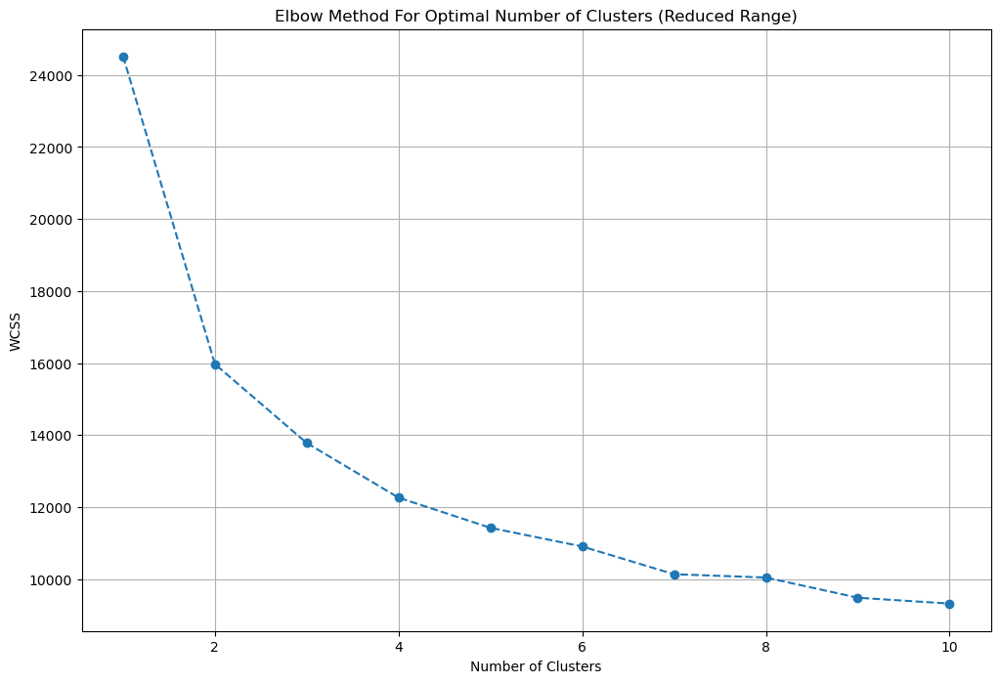

In [151]:
# Plot the results
plt.figure(figsize=(12, 8))
plt.plot(range(1,11), wcss_reduced, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal Number of Clusters (Reduced Range)')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

In [152]:
# Define the weights for each feature as provided
# Assigning weights based on perceived luxury contribution
weights = {
    '24/7 Power Backup': 8,
    '24/7 Water Supply': 4,
    '24x7 Security': 7,
    'ATM': 4,
    'Aerobics Centre': 6,
    'Airy Rooms': 8,
    'Amphitheatre': 7,
    'Badminton Court': 7,
    'Banquet Hall': 8,
    'Bar/Chill-Out Lounge': 9,
    'Barbecue': 7,
    'Basketball Court': 7,
    'Billiards': 7,
    'Bowling Alley': 8,
    'Business Lounge': 9,
    'CCTV Camera Security': 8,
    'Cafeteria': 6,
    'Car Parking': 6,
    'Card Room': 6,
    'Centrally Air Conditioned': 9,
    'Changing Area': 6,
    "Children's Play Area": 7,
    'Cigar Lounge': 9,
    'Clinic': 5,
    'Club House': 9,
    'Concierge Service': 9,
    'Conference room': 8,
    'Creche/Day care': 7,
    'Cricket Pitch': 7,
    'Doctor on Call': 6,
    'Earthquake Resistant': 5,
    'Entrance Lobby': 7,
    'False Ceiling Lighting': 6,
    'Feng Shui / Vaastu Compliant': 5,
    'Fire Fighting Systems': 8,
    'Fitness Centre / GYM': 8,
    'Flower Garden': 7,
    'Food Court': 6,
    'Foosball': 5,
    'Football': 7,
    'Fountain': 7,
    'Gated Community': 7,
    'Golf Course': 10,
    'Grocery Shop': 6,
    'Gymnasium': 8,
    'High Ceiling Height': 8,
    'High Speed Elevators': 8,
    'Infinity Pool': 9,
    'Intercom Facility': 7,
    'Internal Street Lights': 6,
    'Internet/wi-fi connectivity': 7,
    'Jacuzzi': 9,
    'Jogging Track': 7,
    'Landscape Garden': 8,
    'Laundry': 6,
    'Lawn Tennis Court': 8,
    'Library': 8,
    'Lounge': 8,
    'Low Density Society': 7,
    'Maintenance Staff': 6,
    'Manicured Garden': 7,
    'Medical Centre': 5,
    'Milk Booth': 4,
    'Mini Theatre': 9,
    'Multipurpose Court': 7,
    'Multipurpose Hall': 7,
    'Natural Light': 8,
    'Natural Pond': 7,
    'Park': 8,
    'Party Lawn': 8,
    'Piped Gas': 7,
    'Pool Table': 7,
    'Power Back up Lift': 8,
    'Private Garden / Terrace': 9,
    'Property Staff': 7,
    'RO System': 7,
    'Rain Water Harvesting': 7,
    'Reading Lounge': 8,
    'Restaurant': 8,
    'Salon': 8,
    'Sauna': 9,
    'Security / Fire Alarm': 9,
    'Security Personnel': 9,
    'Separate entry for servant room': 8,
    'Sewage Treatment Plant': 6,
    'Shopping Centre': 7,
    'Skating Rink': 7,
    'Solar Lighting': 6,
    'Solar Water Heating': 7,
    'Spa': 9,
    'Spacious Interiors': 9,
    'Squash Court': 8,
    'Steam Room': 9,
    'Sun Deck': 8,
    'Swimming Pool': 8,
    'Temple': 5,
    'Theatre': 9,
    'Toddler Pool': 7,
    'Valet Parking': 9,
    'Video Door Security': 9,
    'Visitor Parking': 7,
    'Water Softener Plant': 7,
    'Water Storage': 7,
    'Water purifier': 7,
    'Yoga/Meditation Area': 7
}

In [153]:
features_binary_df.columns

Index(['24/7 Power Backup', '24/7 Water Supply', '24x7 Security', 'ATM',
       'Aerobics Centre', 'Air Hockey', 'Airy Rooms', 'Amphitheatre',
       'Automated Car Wash', 'Badminton Court',
       ...
       'Visitors Parking', 'Volley Ball Court', 'Waiting Lounge',
       'Waste Disposal', 'Water Softener Plant', 'Water Storage',
       'Water purifier', 'Water softening plant', 'Wi-Fi Connectivity',
       'Yoga/Meditation Area'],
      dtype='object', length=130)

In [154]:
weights.keys()

dict_keys(['24/7 Power Backup', '24/7 Water Supply', '24x7 Security', 'ATM', 'Aerobics Centre', 'Airy Rooms', 'Amphitheatre', 'Badminton Court', 'Banquet Hall', 'Bar/Chill-Out Lounge', 'Barbecue', 'Basketball Court', 'Billiards', 'Bowling Alley', 'Business Lounge', 'CCTV Camera Security', 'Cafeteria', 'Car Parking', 'Card Room', 'Centrally Air Conditioned', 'Changing Area', "Children's Play Area", 'Cigar Lounge', 'Clinic', 'Club House', 'Concierge Service', 'Conference room', 'Creche/Day care', 'Cricket Pitch', 'Doctor on Call', 'Earthquake Resistant', 'Entrance Lobby', 'False Ceiling Lighting', 'Feng Shui / Vaastu Compliant', 'Fire Fighting Systems', 'Fitness Centre / GYM', 'Flower Garden', 'Food Court', 'Foosball', 'Football', 'Fountain', 'Gated Community', 'Golf Course', 'Grocery Shop', 'Gymnasium', 'High Ceiling Height', 'High Speed Elevators', 'Infinity Pool', 'Intercom Facility', 'Internal Street Lights', 'Internet/wi-fi connectivity', 'Jacuzzi', 'Jogging Track', 'Landscape Garde

In [155]:
missing_features = [feature for feature in weights.keys() if feature not in features_binary_df.columns]
missing_features

[]

In [156]:
# Filter out weights for columns that exist in the DataFrame
valid_weights = {col: weights[col] for col in weights if col in features_binary_df.columns}

In [157]:
# Calculate luxury score for each row using valid weights
luxury_score = features_binary_df[list(valid_weights.keys())].multiply(list(valid_weights.values())).sum(axis=1)

In [158]:
df['luxury_score'] = luxury_score

In [159]:
df.head()

,society,property_type,price,price_per_sqft,areaWithType,area,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,property_id,sector,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,features_list,luxury_score
0,emaar palm gardens,flat,1.75,9210.0,Super Built up area 1900(176.52 sq.m.)Built Up area: 1600 sq.ft. (148.64 sq.m.)Carpet area: 1240 sq.ft. (115.2 sq.m.),1900.0,3,3,3,servant room,6.0,West,Relatively New,"[""V'Lante Mall"", 'NH 48 Gurugram', 'iGrow Montessori Play School', 'Matrikiran High School', 'Badsa AMS Hospital', 'GlobalHealthcare Multispeciality', 'Indira Gandhi International Airport', 'Patli Railway Station', 'Hyatt Regency', 'Nakhrola Stadium', 'Cricket Academy']","['3 Wardrobe', '8 Fan', '1 Exhaust Fan', '1 Stove', '10 Light', '1 Chimney', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Curtains', 'No Dining Table', 'No Geyser', 'No Microwave', 'No Fridge', 'No Sofa', 'No TV', 'No Washing Machine', 'No Water Purifier']","['Water purifier', 'Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Private Garden / Terrace', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Bank Attached Property', 'Internet/wi-fi connectivity', 'Recently Renovated', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Low Density Society', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']",V69525180,sector 83,1900.0,1600.0,1240.0,0,1,0,0,0,2,"[Water purifier, Security / Fire Alarm, Feng Shui / Vaastu Compliant, Private Garden / Terrace, Intercom Facility, Lift(s), High Ceiling Height, Maintenance Staff, Water Storage, Separate entry for servant room, No open drainage around, Bank Attached Property, Internet/wi-fi connectivity, Recently Renovated, Visitor Parking, Swimming Pool, Park, Security Personnel, Natural Light, Airy Rooms, Low Density Society, Waste Disposal, Rain Water Harvesting, Water softening plant, Shopping Centre, Fitness Centre / GYM, Club house / Community Center]",150
1,eros wembley estate,flat,1.40,10174.0,Super Built up area 1376(127.83 sq.m.),1376.0,3,3,2,store room,9.0,East,Relatively New,"['Sri Radhe Krishna Temple', 'Standard chartered ATM', 'Icici bank ATM', 'Bones Clinic - Orthopaedics', 'Skin Clinic', 'Divine Look Clinic Centre', 'Vatsalya Clinic', 'Dr. Naresh Pandita', 'Dr. Anuj Sharma', 'Meher Clinic', 'Vishesh Dental', 'Neelkanth Health Care', 'Dr. Aruna Kalra', 'Wellness Eye Centre', 'Park Hospital Gurgaon', 'Best Urologist Atcomplete Family Clinic', 'Ekta Hospital', 'Sai Heart and Trauma Center', 'Sanjeevani Hospital Gurgaon', 'Sona Devi Memorial Hospital and Trauma Centre', 'Sai Dharamraj Hospital', 'Wembley estate club', 'Genius', 'Gardian Pharmacy', 'Apollo Pharmacy', 'SPAZE BUSINESS PARK', 'Kore Tech Park', 'Unitech', 'Hdfc bank', 'Hdfc bank', 'Icici bank', 'Indusind bank', 'Hdfc bank', 'Hdfc bank', 'SRS Cinemas', 'India', 'Madison and Pike', 'Haldiram', ""Domino's Pizza"", ""Nirula's"", 'Starbucks', 'Nook', 'Kamla International', 'Gurugram University', 'Delhi Public School Primary Section']","['2 Wardrobe', '1 Water Purifier', '5 Fan', '1 Exhaust Fan', '2 Geyser', '6 Light', '1 Curtains', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Chimney', 'No Dining Table', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Washing Machine']","['Security / Fire Alarm', 'Power Back-up', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Piped-gas', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Internet/wi-fi connectivity', 'Shopping Centre', 'Fitness Cen

In [160]:
# cols to drop -> nearbyLocations,furnishDetails, features,features_list, additionalRoom
df.drop(columns=['nearbyLocations','furnishDetails','features','features_list','additionalRoom'],inplace=True)

In [161]:
df.sample(5)

,society,property_type,price,price_per_sqft,areaWithType,area,bedRoom,bathroom,balcony,floorNum,facing,agePossession,property_id,sector,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
117,independent,house,2.80,18667.0,Built Up area: 1500 (139.35 sq.m.),1500.0,4,4,0,2.0,NaN,Undefined,NaN,sector 55,NaN,1500.0,NaN,0,0,0,0,0,0,0
216,smart world gems,flat,1.16,8151.0,Carpet area: 1423 (132.2 sq.m.),1423.0,3,3,2,3.0,South-East,Under Construction,W66156744,sector 89,NaN,NaN,1423.0,1,0,0,0,0,0,68
1096,bestech park view grand spa,flat,2.22,8345.0,Super Built up area 2660(247.12 sq.m.),2660.0,3,4,3+,15.0,South-East,Relatively New,Z68363354,sector 81,2660.0,NaN,NaN,0,1,0,0,0,2,174
2449,unitech uniworld resorts,house,NaN,NaN,Plot area 520(434.79 sq.m.),NaN,5,8,3+,4.0,West,Relatively New,NaN,sector 33,NaN,520.0,NaN,0,1,1,0,0,2,100
743,vatika inxt floors,flat,1.25,8333.0,Carpet area: 1500 (139.35 sq.m.),1500.0,3,2,3,2.0,North,Relatively New,Z67067884,sector 82,NaN,NaN,1500.0,1,0,0,1,0,2,94


In [162]:
df.shape

(3480, 24)

In [163]:
df.to_csv('C:/Users/SONY/Machine_Learning_Project/Processed_Data/gurgaon_properties_cleaned_v2.csv',index=False)